<h1><center> Action Recognition with CAM visualization </center> </h1>

<br>Author: Wendell Hom
<br>Dataset: Stanford-40 action
<br>Architecture: Inception-ResNet-v2 + 
<br>Input Image Size: 500x500x3
<br>Initial Learning Rate: .0001, decrease by a factor of 10 if no improvement to validation loss


This notebook implements action recognition CNN using Inception-ResNet-v2, and includes a Global Average Pooling layer followed by a 40-way softmax which uses categorical crossentropy.
The GAP layer makes it simple to visualize the class activation map in order to understand which parts of the image was significant in leading the model to the given prediction.

A few images downloaded from the web was also used to do inference in the wild at the bottom of this notebook.


In [1]:
import tensorflow as tf


# Check tensorflow version
print("Using Tensorflow %s\n" % (tf.__version__))

# Check to see if graphics card is doing OK memory-wise
!nvidia-smi

Using Tensorflow 2.0.0

Fri Mar 13 06:32:31 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.87.01    Driver Version: 418.87.01    CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  On   | 00000000:00:1E.0 Off |                    0 |
| N/A   43C    P0    49W / 300W |      0MiB / 16130MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                    

In [2]:
%load_ext tensorboard

In [3]:
from tensorflow.keras.metrics import top_k_categorical_accuracy

def top5(y_true, y_pred):
    return top_k_categorical_accuracy(y_true, y_pred, k=5)




In [4]:
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers

from sklearn import metrics
import math
import numpy as np
from tensorflow.keras.models       import Model


## Run this section if we are loading the previously trained model

from tensorflow.keras.models import load_model

from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input


dependencies = {
    'top5': top5
}


model =load_model('models/class_only/30_epochs.h5')

model.summary()

## Create Model Using ImageNet Weights

In [5]:
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

pixels = 500
# Input pixel dimensions.  All training and test examples will be resized to (pixel, pixel, 3)
conv_base = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(pixels,pixels,3))

conv_base.trainable = False

train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, rotation_range=10, zoom_range= [0.9,1.1])
test_datagen = ImageDataGenerator(rescale=1./255)

In [6]:
conv_base.summary()

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 500, 500, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 249, 249, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 249, 249, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 249, 249, 32) 0           batch_normalization[0][0]        
________________________________________________________________________________

__________________________________________________________________________________________________
activation_188 (Activation)     (None, 14, 14, 192)  0           batch_normalization_188[0][0]    
__________________________________________________________________________________________________
conv2d_189 (Conv2D)             (None, 14, 14, 224)  129024      activation_188[0][0]             
__________________________________________________________________________________________________
batch_normalization_189 (BatchN (None, 14, 14, 224)  672         conv2d_189[0][0]                 
__________________________________________________________________________________________________
activation_189 (Activation)     (None, 14, 14, 224)  0           batch_normalization_189[0][0]    
__________________________________________________________________________________________________
conv2d_187 (Conv2D)             (None, 14, 14, 192)  399360      block8_6_ac[0][0]                
__________

In [7]:
model = models.Sequential()
model.add(conv_base)
model.add(layers.Conv2D(1024, (3, 3), padding="same", strides=(1, 1), activation="relu", name="ClassConv"))
model.add(layers.GlobalAveragePooling2D(name="GAP"))
model.add(layers.Dense(40, activation="softmax", name="class"))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2 (Model)  (None, 14, 14, 1536)      54336736  
_________________________________________________________________
ClassConv (Conv2D)           (None, 14, 14, 1024)      14156800  
_________________________________________________________________
GAP (GlobalAveragePooling2D) (None, 1024)              0         
_________________________________________________________________
class (Dense)                (None, 40)                41000     
Total params: 68,534,536
Trainable params: 14,197,800
Non-trainable params: 54,336,736
_________________________________________________________________


In [8]:
all_amp_layer_weights = model.layers[-1].get_weights()[0]

In [9]:
all_amp_layer_weights.shape

(1024, 40)

In [10]:
cam_shape = tuple(model.get_layer("ClassConv").output.get_shape().as_list()[1:])
cam_shape

(14, 14, 1024)

## Create train and test generators

In [11]:
train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, rotation_range=10, zoom_range= [0.9,1.1])
test_datagen = ImageDataGenerator(rescale=1./255)

In [12]:
BATCH_SIZE = 12


train_generator = train_datagen.flow_from_directory("Stanford40/train", batch_size=BATCH_SIZE, target_size=(pixels,pixels), class_mode = 'categorical')
valid_generator = test_datagen.flow_from_directory("Stanford40/test", batch_size=BATCH_SIZE, target_size=(pixels,pixels), class_mode = 'categorical', shuffle=False)

y_true = valid_generator.classes

train_m = len(train_generator.classes)
valid_m = len(valid_generator.classes)

mapping = dict()
for activity, idx in train_generator.class_indices.items():
    mapping[idx] = activity

train_steps = math.ceil(train_m/BATCH_SIZE)
valid_steps = math.ceil(valid_m/BATCH_SIZE)



Found 6693 images belonging to 40 classes.
Found 2839 images belonging to 40 classes.


In [13]:
from tensorflow.keras.callbacks import ReduceLROnPlateau


filepath = "models/class_only/checkpoints/epoch_{epoch:02d}-{val_loss:.2f}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='min')

#callback = tf.keras.callbacks.EarlyStopping(monitor='classification_loss', patience=5)

logdir = "models/class_only/logs"

tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)


In [14]:
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(lr=1e-4), metrics = ['acc'])


In [15]:
prev_epochs = 0
epochs = 15

In [16]:
history = model.fit_generator(train_generator, steps_per_epoch=train_steps, initial_epoch=prev_epochs, epochs=epochs, validation_data=valid_generator, validation_steps=valid_steps, callbacks=[tensorboard_callback, checkpoint])

Epoch 1/15
557/558 [============================>.] - ETA: 0s - loss: 1.6275 - acc: 0.5861
Epoch 00001: val_loss improved from inf to 0.88446, saving model to models/class_only/checkpoints/epoch_01-0.88.h5
558/558 [==============================] - 645s 1s/step - loss: 1.6260 - acc: 0.5863 - val_loss: 0.8845 - val_acc: 0.7594
Epoch 2/15
557/558 [============================>.] - ETA: 0s - loss: 0.8640 - acc: 0.7497
Epoch 00002: val_loss improved from 0.88446 to 0.73426, saving model to models/class_only/checkpoints/epoch_02-0.73.h5
558/558 [==============================] - 609s 1s/step - loss: 0.8640 - acc: 0.7496 - val_loss: 0.7343 - val_acc: 0.7890
Epoch 3/15
557/558 [============================>.] - ETA: 0s - loss: 0.7388 - acc: 0.7780
Epoch 00003: val_loss improved from 0.73426 to 0.66458, saving model to models/class_only/checkpoints/epoch_03-0.66.h5
558/558 [==============================] - 610s 1s/step - loss: 0.7389 - acc: 0.7780 - val_loss: 0.6646 - val_acc: 0.8158
Epoch 4/

In [ ]:
history2 = model.fit_generator(train_generator, steps_per_epoch=train_steps, epochs=40, validation_data=valid_generator, validation_steps=valid_steps)

In [ ]:
score = model.evaluate_generator(valid_generator, 142)

In [ ]:
score

## Saving the Model

In [17]:
model.save("models/class_only/15_epochs.h5")

In [18]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2 (Model)  (None, 14, 14, 1536)      54336736  
_________________________________________________________________
ClassConv (Conv2D)           (None, 14, 14, 1024)      14156800  
_________________________________________________________________
GAP (GlobalAveragePooling2D) (None, 1024)              0         
_________________________________________________________________
class (Dense)                (None, 40)                41000     
Total params: 68,534,536
Trainable params: 14,197,800
Non-trainable params: 54,336,736
_________________________________________________________________


## Plotting Loss and Acc

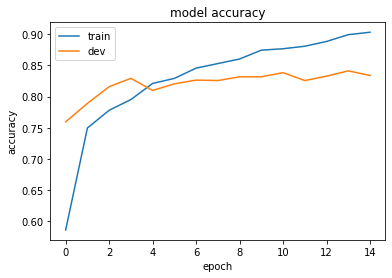

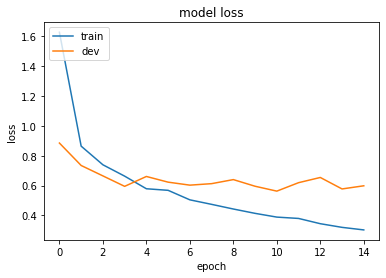

In [23]:
import matplotlib.pyplot as plt

plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'dev'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'dev'], loc='upper left')
plt.show()

## Confusion Matrix

In [24]:
cam_shape = tuple(model.get_layer("ClassConv").output.get_shape().as_list()[1:])


# custom generator
def multiple_outputs(generator, image_dir, batch_size, image_size):
    gen = generator.flow_from_directory(
        image_dir,
        target_size=(image_size, image_size),
        batch_size=batch_size,
        class_mode='categorical', shuffle=False)
    
    while True:
        gnext = gen.next()
        # return image batch and 3 sets of lables
        #yield gnext[0], [np.zeros((gnext[1].shape[0], 14, 14, 1024)), gnext[1]]
        yield gnext[0], [np.zeros((gnext[1].shape[0], *cam_shape)), gnext[1]]

In [25]:
BATCH_SIZE = 12

pixels = 500
train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, rotation_range=10, zoom_range= [0.9,1.1])
test_datagen = ImageDataGenerator(rescale=1./255)

valid_generator = multiple_outputs(test_datagen, 
                                   image_dir="Stanford40/test", 
                                   batch_size=BATCH_SIZE, 
                                   image_size=pixels)

valid_temp = test_datagen.flow_from_directory("Stanford40/test", batch_size=BATCH_SIZE, target_size=(pixels,pixels), class_mode = 'categorical', shuffle=False)
y_true = valid_temp.classes

valid_m = len(valid_temp.classes)

mapping = dict()
for activity, idx in valid_temp.class_indices.items():
    mapping[idx] = activity


valid_steps = math.ceil(valid_m/BATCH_SIZE)


Found 2839 images belonging to 40 classes.


In [56]:
BATCH_SIZE = 12

valid_generator = test_datagen.flow_from_directory("Stanford40/test", batch_size=BATCH_SIZE, target_size=(pixels,pixels), class_mode = 'categorical', shuffle=False)

y_true = valid_generator.classes

valid_m = len(valid_generator.classes)

mapping = dict()
for activity, idx in train_generator.class_indices.items():
    mapping[idx] = activity

valid_steps = math.ceil(valid_m/BATCH_SIZE)


Found 2839 images belonging to 40 classes.


In [57]:
len(y_true)

2839

In [58]:
score = model.evaluate_generator(valid_generator, valid_steps)

In [59]:
score

[0.5982906591100029, 0.8337443]

In [60]:
predictions = model.predict_generator(valid_generator, valid_steps)

In [61]:
predictions = predictions.argmax(axis=1)

In [62]:
len(predictions)

2839

In [63]:
(y_true == predictions).mean()

0.8337442761535752

In [64]:
mapping[5]

'cooking'

In [65]:
matrix = metrics.confusion_matrix(y_true, predictions)

## Plot confusion matrix

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

df_cm = pd.DataFrame(matrix, index = [mapping[i] for i in range(40)], columns = [mapping[i] for i in range(40)])
plt.figure(figsize = (40, 40))
sn.heatmap(df_cm, annot=True)

In [39]:
import pickle
with open('15-epochs-history.txt', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)


## Predicting from own image

In [37]:
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

def predict_image(file, model, mapping):
    
    # load an image from file
    image = load_img(file, target_size=(224, 224))
    image = img_to_array(image)
    image = image.reshape((1,image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    
    cam, yhat = model.predict(image)
    print(cam.shape)
    print(yhat.shape)
    category = np.argmax(yhat)
    return mapping[category]


In [40]:
all_amp_layer_weights=model.layers[-1].get_weights()[0]

In [41]:
all_amp_layer_weights.shape

(1024, 40)

In [42]:
final_model = Model(inputs = model.input, 
                  outputs = (model.get_layer("ClassConv").output, model.get_layer("class").output))
            
final_model.summary()


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2_input (I [(None, 500, 500, 3)]     0         
_________________________________________________________________
inception_resnet_v2 (Model)  (None, 14, 14, 1536)      54336736  
_________________________________________________________________
ClassConv (Conv2D)           (None, 14, 14, 1024)      14156800  
_________________________________________________________________
GAP (GlobalAveragePooling2D) (None, 1024)              0         
_________________________________________________________________
class (Dense)                (None, 40)                41000     
Total params: 68,534,536
Trainable params: 14,197,800
Non-trainable params: 54,336,736
_________________________________________________________________


In [43]:
pixels = final_model.input.get_shape().as_list()[1]
pixels

500

In [52]:
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

def predict(img_path, model, all_amp_layer_weights):
    
    # Load and preprocess image
    img = image.load_img(img_path, target_size=(pixels,pixels))
    
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    
    processed_input = preprocess_input(x)
    
    # Run model's prediction to output from last Conv Layer + category prediction
    last_conv_output, pred_vec = final_model.predict(processed_input)
    # Only 1 training example, so remove batch dimension
    last_conv_output = np.squeeze(last_conv_output)

    # Get category with highest probability
    pred = np.argmax(pred_vec)
    
    scale = pixels / last_conv_output.shape[0]
    filters = last_conv_output.shape[2]
    
    # Rescale to input image sizederstanding was it's reserved for the fi
    mat_for_mult = scipy.ndimage.zoom(last_conv_output, (scale,scale,1), order=1)
    
    # Get the weights associated with the predicted class
    amp_layer_weights = all_amp_layer_weights[:, pred]
    
    # Weighted sum of the activation maps for the predicted class.
    # Then resize back to original image size.
    final_output = np.dot(mat_for_mult.reshape((pixels*pixels, filters)), amp_layer_weights).reshape(pixels,pixels)
    
    return final_output, mapping[pred]
    

.........................

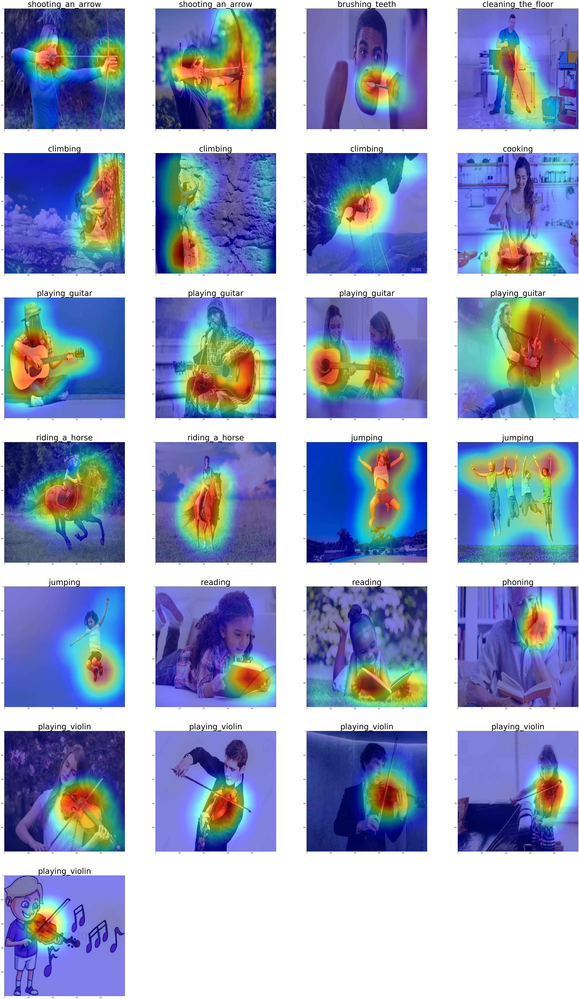

In [53]:
import matplotlib.pyplot as plt
import scipy
import glob

from tensorflow.keras.preprocessing import image

# Images downloaded from internet search engine to try out activity classification
# Images are under images/ directory 
image_dir = "images/"
pattern  = image_dir + "*"
test_images = sorted(glob.glob(pattern))

# Details for the grid size
columns = 4
rows = math.ceil(len(test_images) / columns)
fig = plt.figure(figsize=(80, 20 * rows))

for i, image_name in enumerate(test_images):

    # Progress report
    print(".", end = '')
    image_path = image_dir + image_name
    
    ax = fig.add_subplot(rows, columns, i+1)

    # Load and display original image
    img = tf.keras.preprocessing.image.load_img(image_name, target_size=(pixels,pixels))
    plt.imshow(img)
    
    # Run forward pass to get the Class Activity Map and the predicted class
    cam, pred = predict(image_name, model, all_amp_layer_weights)
    
    # Display class activation map
    plt.imshow(cam, cmap='jet', alpha=0.5)
    # Set title to that of predicted class
    ax.set_title(pred, fontsize =60)
    
    
plt.show()

In [55]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:75% !important; }</style>"))